# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


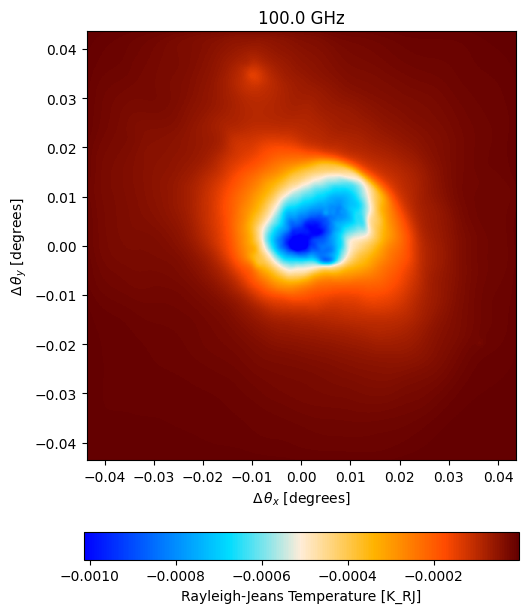

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

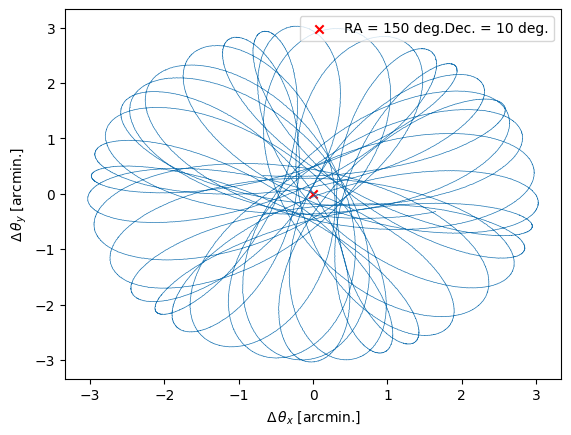

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-11-04 13:57:50.273 INFO: Initialized base in 1444 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]
2024-11-04 13:57:55.910 INFO: Initialized atmosphere in 5623 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


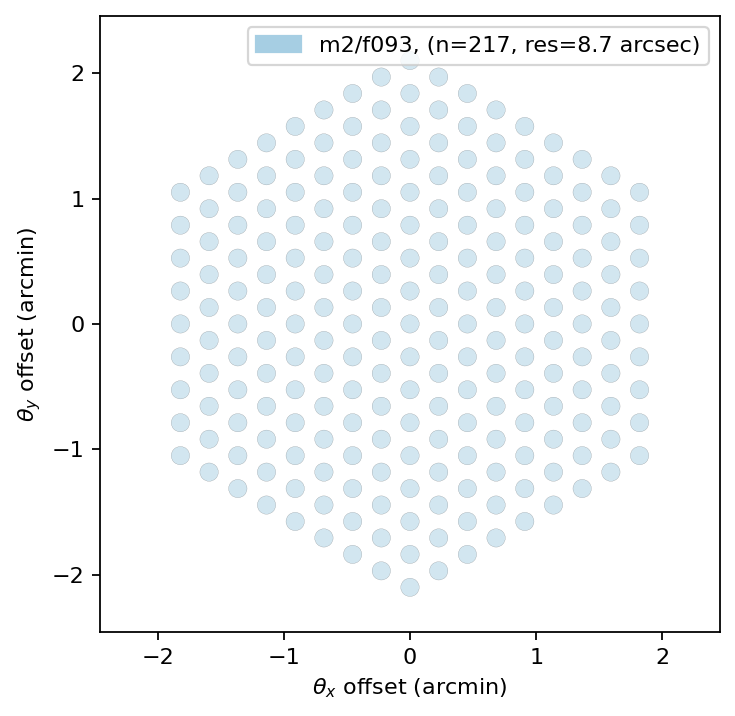

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.25s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


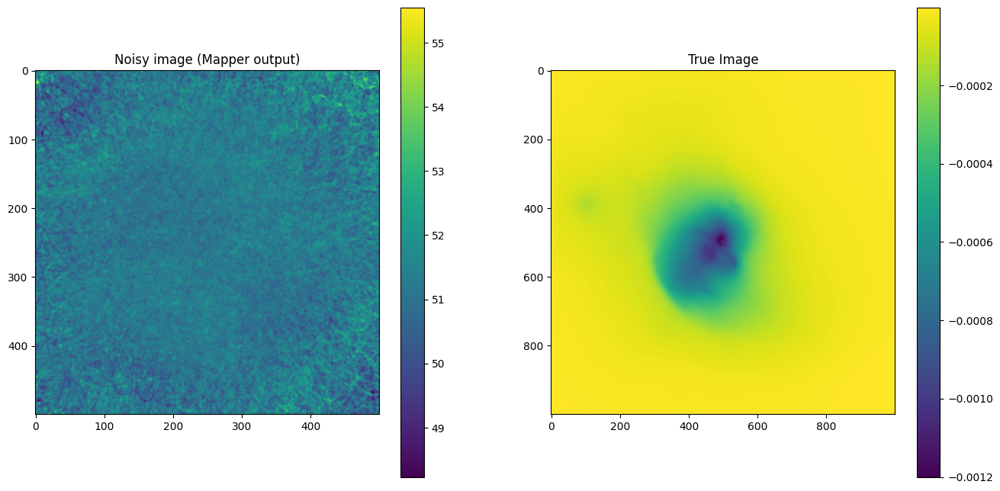

In [5]:
from maria.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 1}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0, 0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-11-04 13:58:09.912 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-11-04 13:58:09.914 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

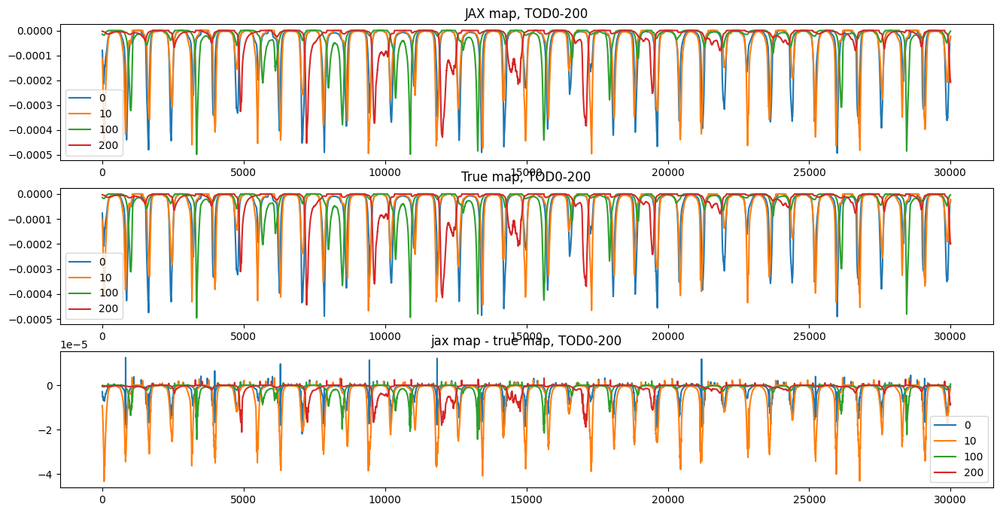

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)

    im2 = axes[2].plot(jax_tods_map[i] - tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX map, TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True map, TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'jax map - true map, TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025175053731982147


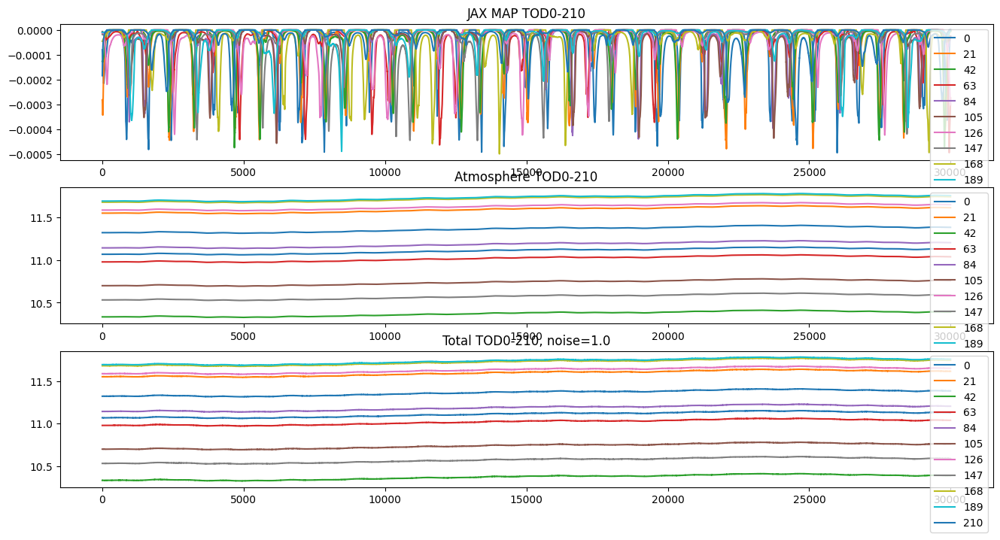

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
# noised_jax_tod = np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

## Test atmosphere slopes:

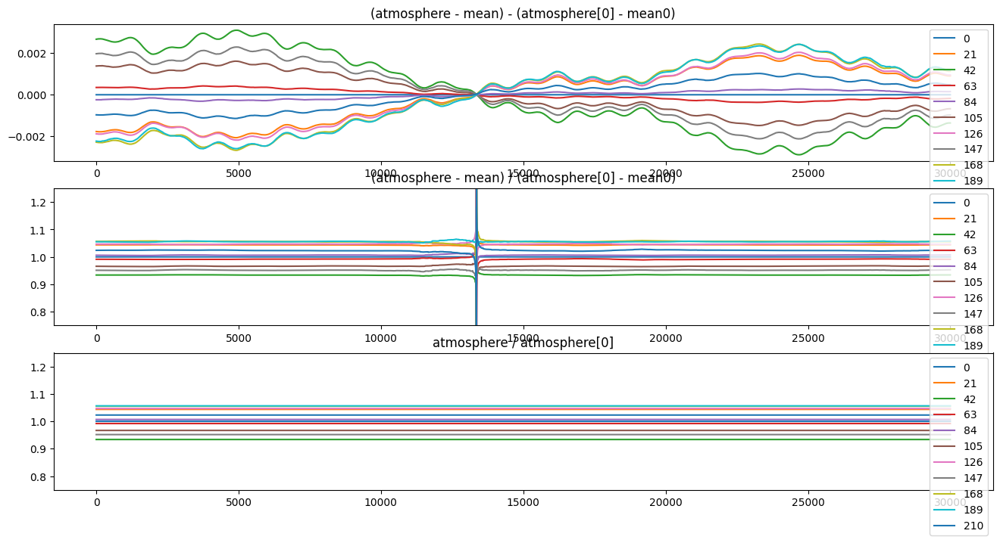

In [9]:
fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot(jax_tods_atmos[i] - jax_tods_atmos[i].mean() - (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[1].plot( (jax_tods_atmos[i] - jax_tods_atmos[i].mean()) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[2].plot(jax_tods_atmos[i]/jax_tods_atmos[0], label=i)
    
axes[0].title.set_text(f'(atmosphere - mean) - (atmosphere[0] - mean0)')
axes[0].legend()
axes[1].title.set_text(f'(atmosphere - mean) / (atmosphere[0] - mean0)')
axes[1].legend()
axes[1].set_ylim([0.75, 1.25])
axes[2].title.set_text(f'atmosphere / atmosphere[0]')
axes[2].legend()
axes[2].set_ylim([0.75, 1.25])

plt.show()

In [10]:
print("real slopes:")
slopes_truth = (jax_tods_atmos) / (jax_tods_atmos[0])
slopes_truth = np.float64(slopes_truth.mean(axis=1))

slopes = noised_jax_tod / noised_jax_tod[0]
slopes = np.float64(slopes.mean(axis=1))
print(slopes_truth.shape)

slopes_truth - slopes

real slopes:
(217,)


array([ 0.00000000e+00,  3.32104929e-07,  4.83856729e-07, -3.08585037e-07,
       -8.97976483e-07, -4.12091484e-07, -1.04755145e-06, -1.90481801e-07,
        4.26097053e-07,  1.46232469e-08,  2.44634036e-07, -2.33424317e-07,
       -1.35136629e-06, -9.42847251e-07, -4.48453233e-07, -8.67328855e-07,
       -1.45915790e-07, -1.03359873e-06,  2.18145626e-07, -4.65608671e-07,
       -5.70473103e-07, -5.60309761e-07, -1.65684828e-06, -1.69517708e-06,
       -1.60488865e-06, -4.09840251e-09, -2.11773212e-07, -1.72794469e-06,
       -1.86609983e-06, -2.61962354e-07, -5.01691548e-08, -3.05468151e-07,
       -1.06913935e-06, -1.35273334e-06, -1.42822762e-06, -1.47698177e-06,
       -1.28530041e-06, -1.73260874e-06, -7.54355008e-07, -1.10247477e-06,
       -1.84947861e-06, -1.24100967e-06, -7.96515275e-07, -1.35664620e-06,
       -1.66457706e-06, -1.98376792e-06, -2.40221713e-06, -1.94129353e-06,
       -7.82798853e-07, -1.00674519e-06, -8.82712593e-07, -1.86433603e-06,
       -2.11116684e-06, -

np.float64(-3.934791608429883e-14)

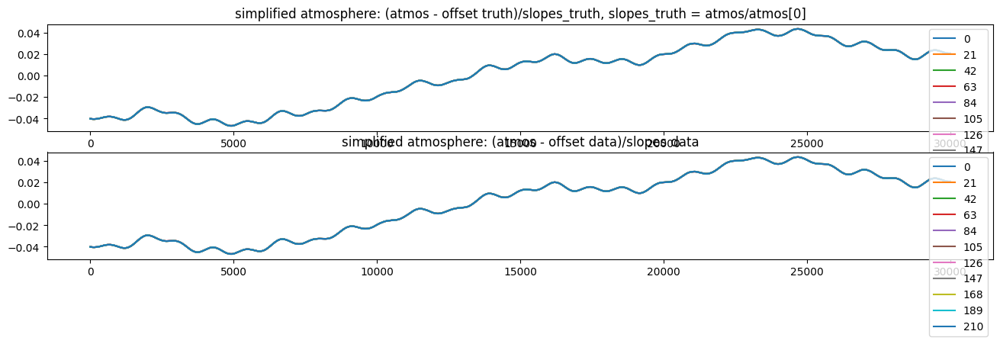

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(16, 4))

# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean(axis=1)[:, None]) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean())
# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean()) / (jax_tods_atmos[0] - jax_tods_atmos.mean())

offset_tod_truth = np.float64(jax_tods_atmos.mean(axis=1))
offset_tod = np.float64(noised_jax_tod.mean(axis=1))

atmos_tod_simplified = (jax_tods_atmos - offset_tod_truth[:, None])/slopes_truth[:, None]

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot( atmos_tod_simplified[i], label=i)
    axes[1].plot( (jax_tods_atmos[i] - offset_tod[i])/slopes[i], label=i)

axes[0].title.set_text(f'simplified atmosphere: (atmos - offset truth)/slopes_truth, slopes_truth = atmos/atmos[0]')
axes[0].legend()
axes[1].title.set_text(f'simplified atmosphere: (atmos - offset data)/slopes data')
axes[1].legend()

atmos_tod_simplified.mean().compute()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [12]:
from modified_CFM import CFM

In [13]:
# padding_atmos = 2000
# padding_atmos = 5000
padding_atmos = 10000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0002, 0.0001))
cf_zm_tod = dict(offset_mean=0.0, offset_std=(1e-5, 0.99e-5))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    fluctuations=(0.0015, 0.0001),
    # loglogavgslope=(-2.5, 0.5), 
    loglogavgslope=(-2.45, 0.1), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize(n)
gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x151b780993a0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x151b7

## Now for the map model:

In [14]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(5.6e-5, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    loglogavgslope=(-2.5, 0.1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

In [15]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

## TOD slope Normal Prior:

In [16]:
# slope_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# slopes_tod = jft.NormalPrior(**slope_dict, name='tod_slopes')

# Using CFM - combined

In [17]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, 1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map

# map-only:

In [18]:
class Signal_TOD_map(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init = self.gp_map.init,
                        domain = self.gp_map.domain )

    def __call__(self, x):
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, 1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        return res_map

# CFM - TOD

In [19]:
class Signal_TOD_tod(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth):
        self.gp_tod = gp_tod
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        super().__init__(init = self.gp_tod.init,
                        domain = self.gp_tod.domain )

    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]


        return res_tods_offset

# Define which signal response to use:

In [20]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth slopes & offsets
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with data slopes & offsets
# signal_response_tod = Signal_TOD_map(gp_map) # map-only
# signal_response_tod = Signal_TOD_tod(gp_tod, offset_tod_truth, slopes_truth) # tod-only

In [21]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x


# Test with simple atmos TODs:
# noised_jax_tod = np.float64(atmos_tod_simplified)[:n] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[:n] + np.float64(jax_tods_map)[:n]
# denoised_jax_tod = np.float64(atmos_tod_simplified)[:n]

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]

lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [22]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x151b7

# Draw Prior sample

(217, 30000)


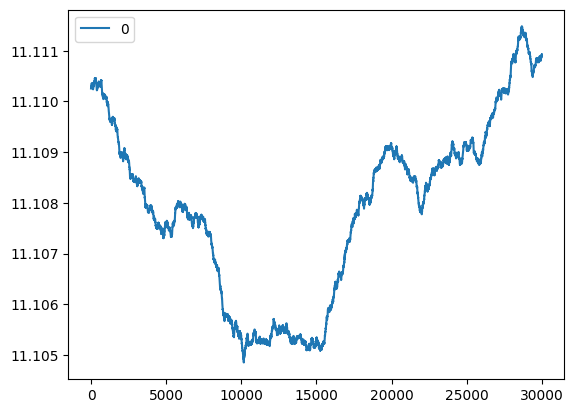

In [23]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [24]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:1.832248e+02 ➽:1.040006e+02
M: Iteration 1 ⛰:+8.474604e+08 Δ⛰:4.299694e+10
M: →:1.0 ↺:False #∇²:12 |↘|:1.017458e+02 ➽:1.040006e+02
M: Iteration 2 ⛰:+1.992306e+08 Δ⛰:6.482298e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+1.9923e+08
OPTIMIZE_KL: #(KL minimization steps) 2
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 6.1e+01±     0.0, avg:    -0.12±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.26±     0.0, avg:    -0.51±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:    0.49±     0.0, avg:     +0.7±     0.0, #dof:      1'
combcf tod loglogavgslope:: 'reduced χ²: 1.9e+01±     0.0, avg:   

In [25]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.41259972, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.50730885, dtype=float64),
	 'cfmapxi': Array([[-1.03499645,  0.82555411,  0.85080541, ..., -0.98286475,
	         0.97537101, -0.71826194],
	       [-0.1902864 ,  2.19741122,  1.14017073, ..., -0.19436883,
	         0.07323454, -0.00880851],
	       [ 0.69407355,  1.02000509, -1.10112558, ...,  1.24541153,
	         0.51694675,  1.31634182],
	       ...,
	       [-1.60398265, -0.26005042, -1.48655861, ..., -0.63162889,
	         1.6332523 , -1.20400369],
	       [ 1.22768001,  0.65303005, -0.80189374, ...,  0.55218133,
	         0.35145663,  1.342724  ],
	       [-0.02370482,  0.45176854, -0.84075436, ...,  0.60660175,
	        -0.23666425, -0.44504955]], dtype=float64),
	 'cfmapzeromode': Array(-0.40876077, dtype=float64),
	 'combcf tod fluctuations': Array(0.69941435, dtype=float64),
	 'combcf tod loglogavgslope': Array(4.31284982, dtype=float64),
	 'combcf xi': Array([[ -0.51165

In [26]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.001568035792792954, 0.0015, 0.0001
	loglogvarslope: -2.018715018311882, -2.45, 0.1
	zeromode std (LogNormal): 2.023082767818565e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.5580088268701464e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.550730885362671, -2.5, 0.1
	zeromode std (LogNormal): 4.1349533715480996e-10, 1e-08, 1e-07


(217, 30000)


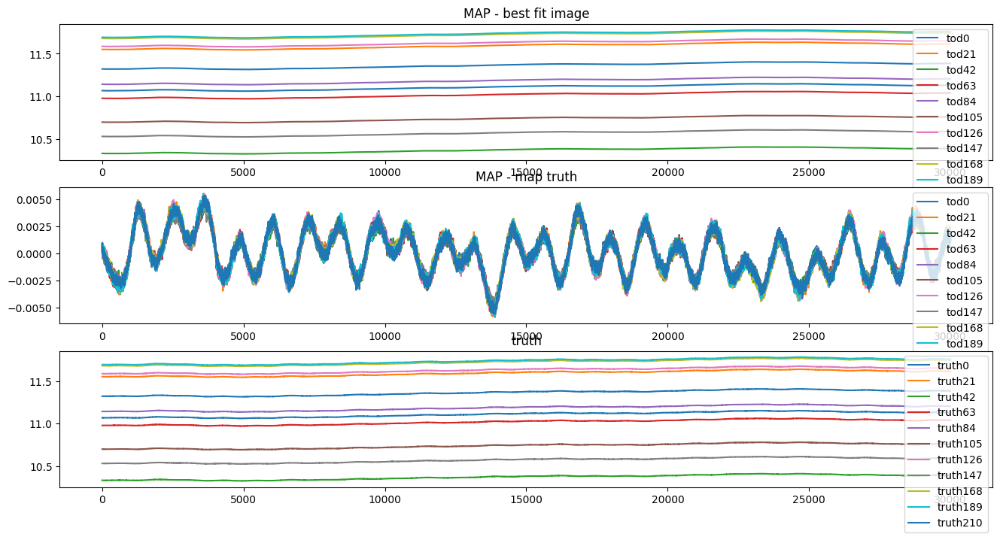

In [27]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

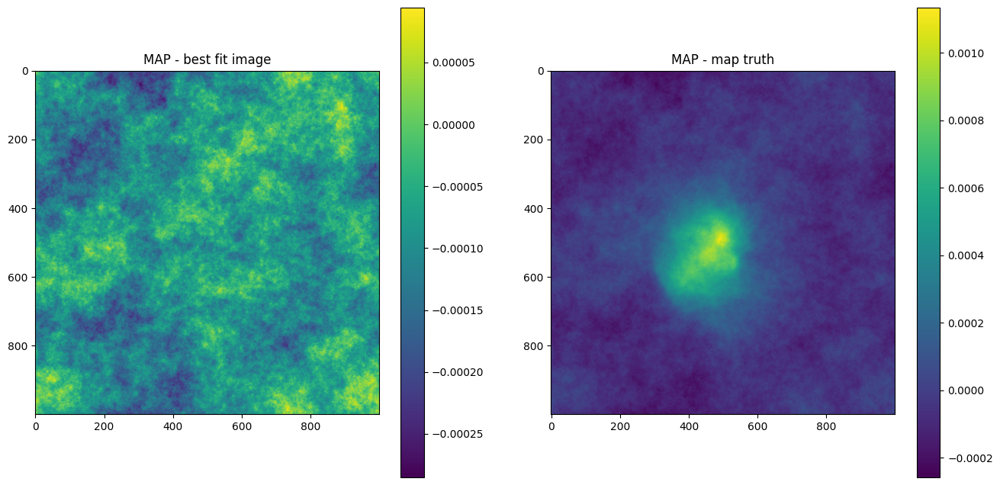

In [28]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0, 0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [29]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.8392e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.9035e+07 Δ⛰:1.6489e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.1465e+07 Δ⛰:7.5701e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+4.8890e+06 Δ⛰:6.5761e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.8401e+06 Δ⛰:2.0489e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.1675e+06 Δ⛰:6.7261e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+9.9717e+05 Δ⛰:1.1703e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.2181e+05 Δ⛰:4.7535e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.9375e+05 Δ⛰:2.2806e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.4888e+05 Δ⛰:1.4487e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-1.8078e+03 Δ⛰:1.5068e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-1.0024e+05 Δ⛰:9.8436e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-1.0480e+05 Δ⛰:4.5520e+03 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.7724e+05 Δ⛰:7.2447e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.7963e+05 Δ⛰:2.3865e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.1364e+05 Δ⛰:3.4014e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.7642e+05 Δ⛰:6.2777e+04 ➽:1.0400e+01
SL: 

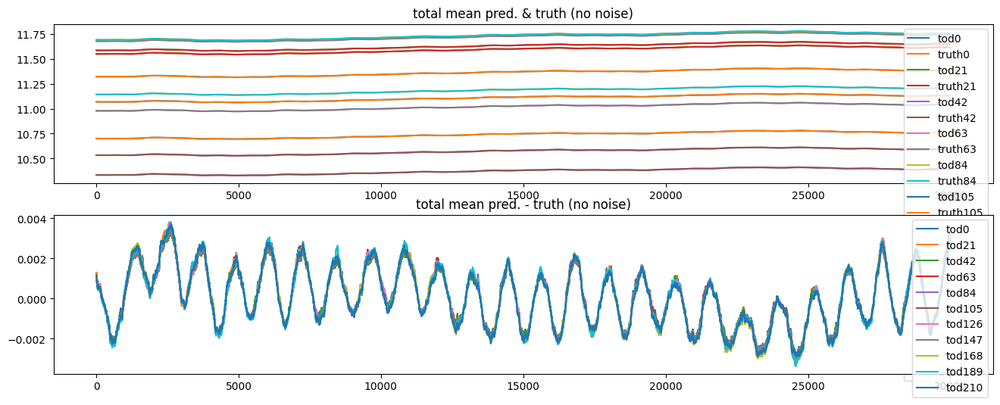

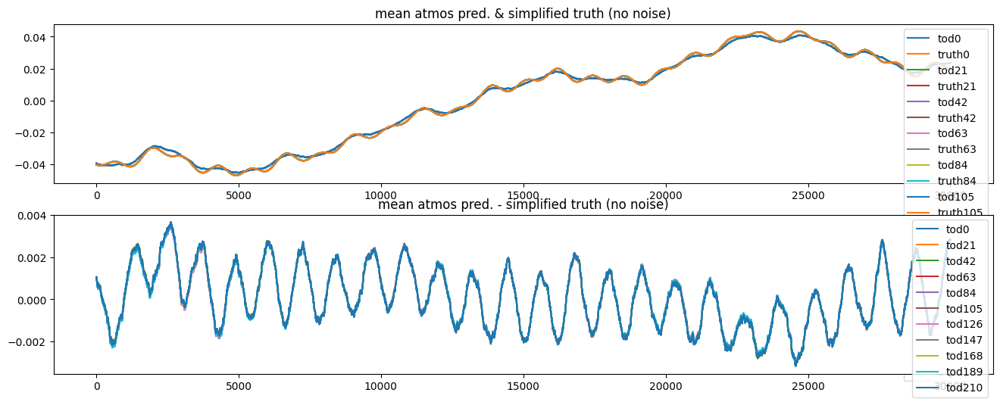

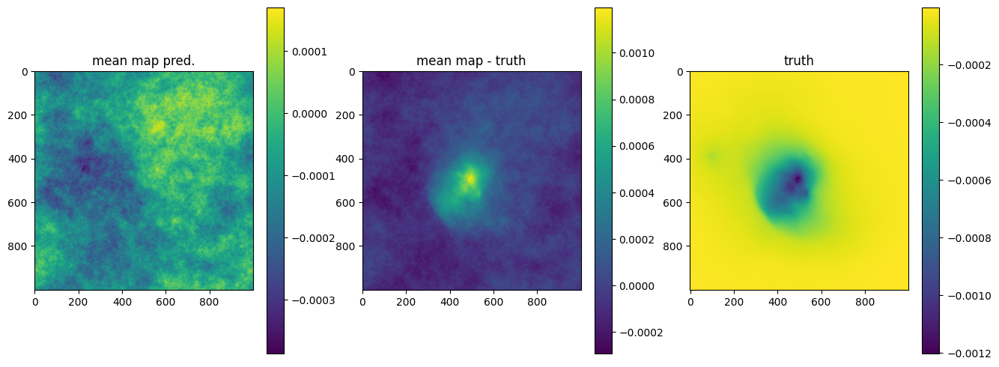

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.5028e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.1346e+08 Δ⛰:3.6822e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.9018e+07 Δ⛰:8.4442e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+9.0514e+06 Δ⛰:1.9967e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+6.1644e+06 Δ⛰:2.8870e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.4452e+06 Δ⛰:1.7192e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+3.6890e+06 Δ⛰:7.5625e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.5755e+06 Δ⛰:1.1134e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.8122e+06 Δ⛰:7.6329e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.5766e+06 Δ⛰:2.3566e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.5352e+06 Δ⛰:4.1373e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.2702e+06 Δ⛰:2.6497e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.0220e+06 Δ⛰:2.4819e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+7.8126e+05 Δ⛰:2.4078e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+6.4240e+05 Δ⛰:1.3886e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+4.6647e+05 Δ⛰:1.7593e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.6275e+05 Δ⛰:3.7229e+03 ➽:1.0400e+01
SL: 

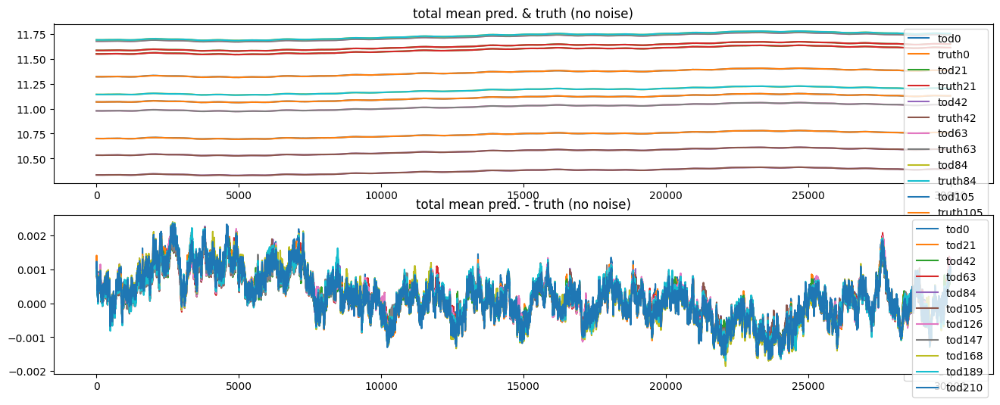

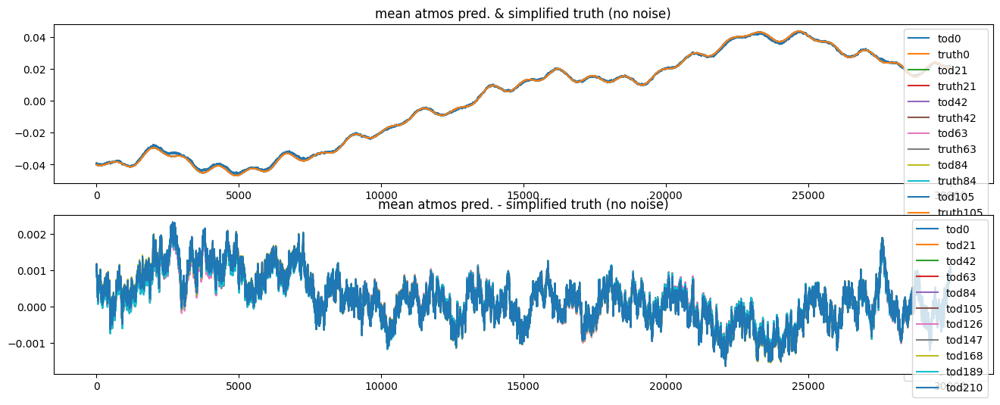

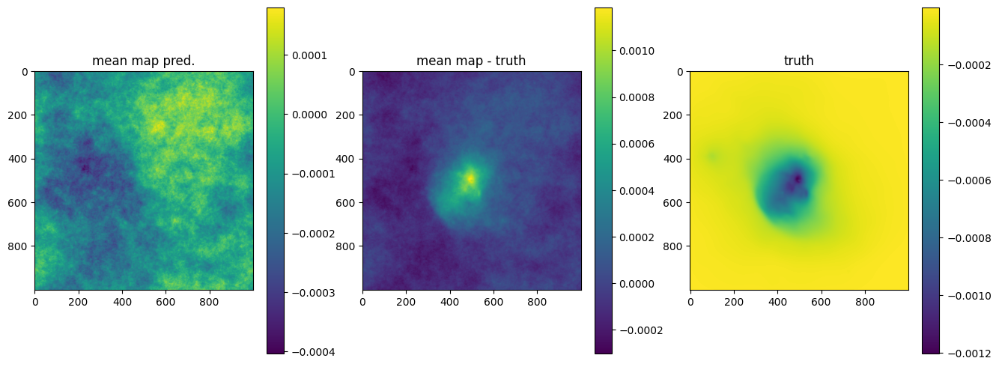

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+2.3370e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.1416e+07 Δ⛰:1.7228e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.6938e+07 Δ⛰:3.4478e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.2596e+07 Δ⛰:4.3422e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.7355e+07 Δ⛰:5.2402e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.1941e+07 Δ⛰:5.4145e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.3680e+06 Δ⛰:4.5729e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+6.0244e+06 Δ⛰:1.3436e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+5.5064e+06 Δ⛰:5.1803e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+5.4729e+06 Δ⛰:3.3461e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+4.6795e+06 Δ⛰:7.9341e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+4.1174e+06 Δ⛰:5.6208e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.5212e+06 Δ⛰:5.9622e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+3.0409e+06 Δ⛰:4.8027e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.7026e+06 Δ⛰:3.3837e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.4102e+06 Δ⛰:2.9236e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+2.3267e+06 Δ⛰:8.3514e+04 ➽:1.0400e+01
SL: 

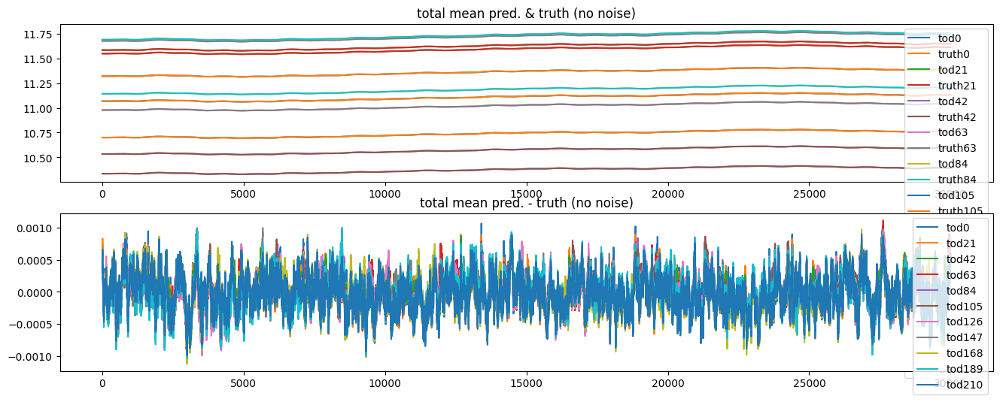

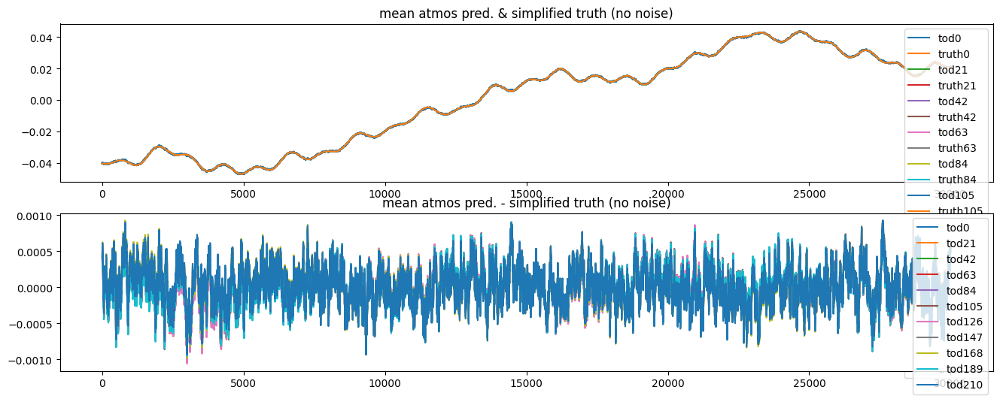

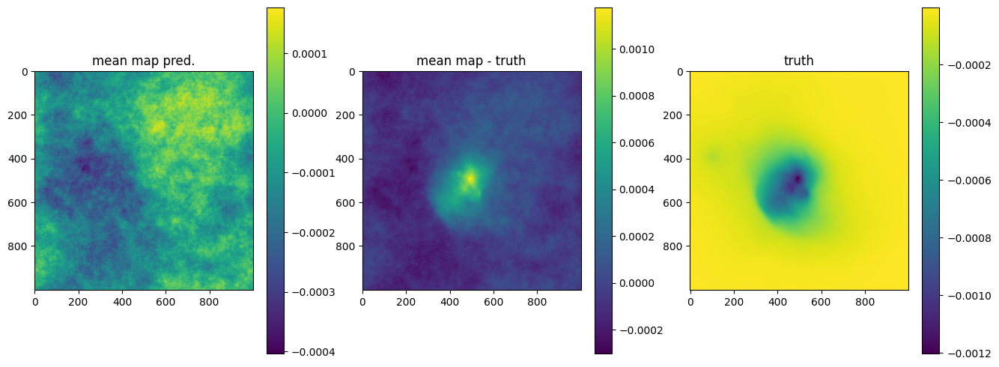

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+2.0860e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.6565e+08 Δ⛰:4.2944e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.9202e+07 Δ⛰:1.2645e+08 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.2591e+07 Δ⛰:1.6610e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.4437e+07 Δ⛰:8.1539e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.7712e+06 Δ⛰:4.6661e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.6575e+06 Δ⛰:2.1137e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+6.8795e+06 Δ⛰:7.7808e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+5.2839e+06 Δ⛰:1.5955e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+5.0552e+06 Δ⛰:2.2872e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+4.6372e+06 Δ⛰:4.1800e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+4.1894e+06 Δ⛰:4.4779e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.7852e+06 Δ⛰:4.0416e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+3.1217e+06 Δ⛰:6.6356e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.5684e+06 Δ⛰:5.5327e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.1706e+06 Δ⛰:3.9782e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+2.1678e+06 Δ⛰:2.7892e+03 ➽:1.0400e+01
SL: 

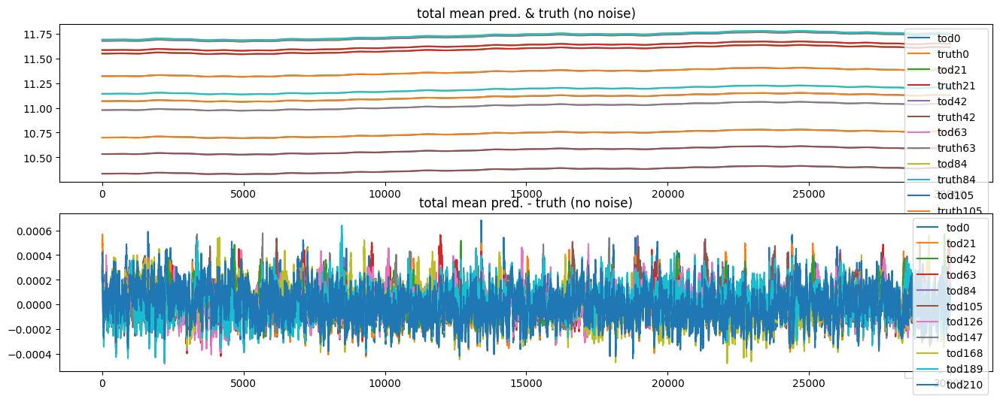

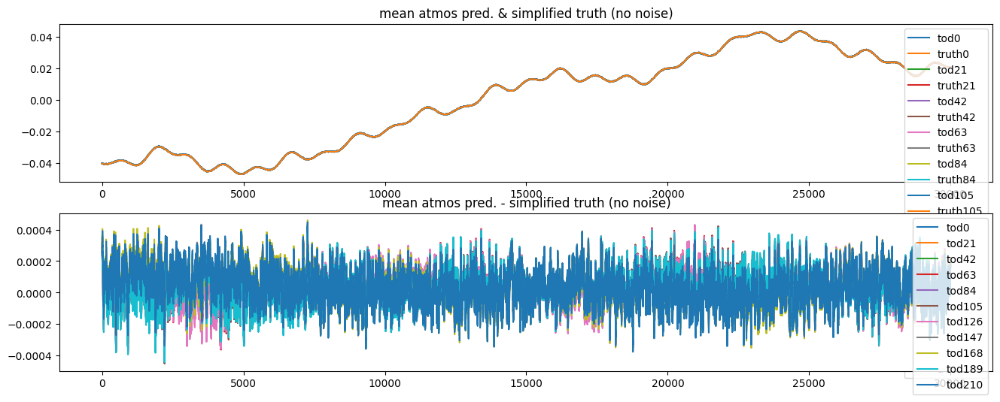

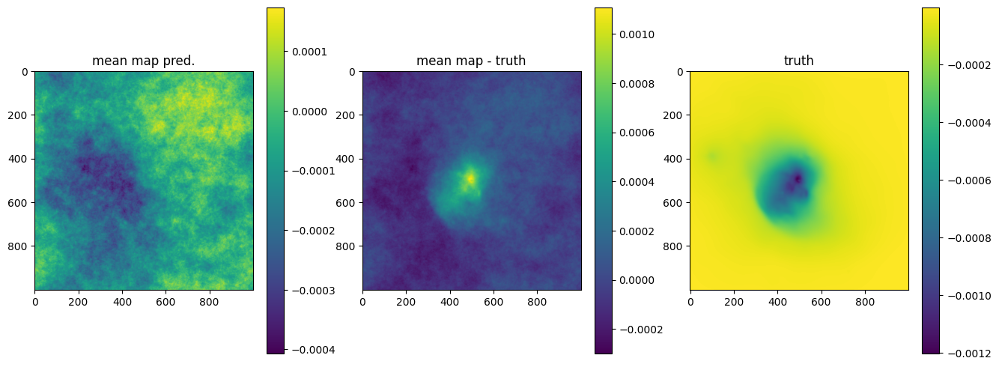

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+1.9693e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.5331e+07 Δ⛰:1.3160e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.4868e+07 Δ⛰:4.0464e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.5135e+07 Δ⛰:9.7328e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.0839e+07 Δ⛰:4.2961e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+5.4041e+06 Δ⛰:5.4347e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+4.6164e+06 Δ⛰:7.8765e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.5010e+06 Δ⛰:1.1154e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.9580e+06 Δ⛰:5.4298e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.2755e+06 Δ⛰:6.8253e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.2552e+06 Δ⛰:2.0289e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.9418e+06 Δ⛰:3.1341e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.7173e+06 Δ⛰:2.2445e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.4658e+06 Δ⛰:2.5154e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.2163e+06 Δ⛰:2.4947e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.0176e+06 Δ⛰:1.9876e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+8.7239e+05 Δ⛰:1.4517e+05 ➽:1.0400e+01
SL: 

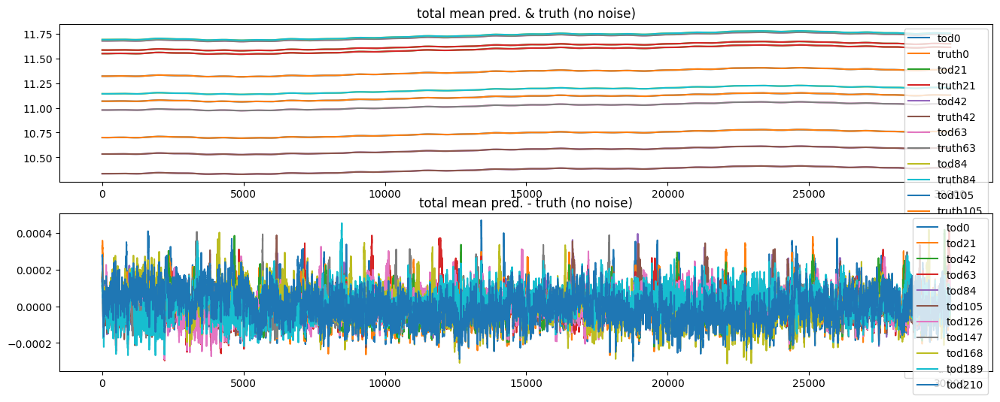

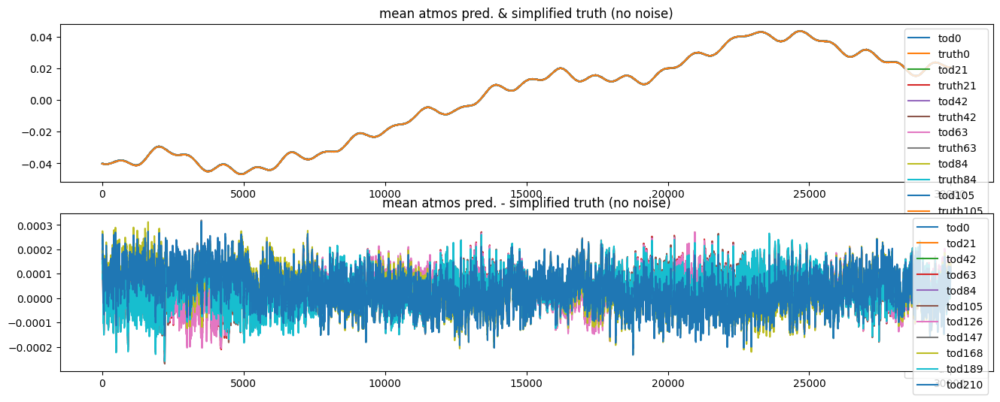

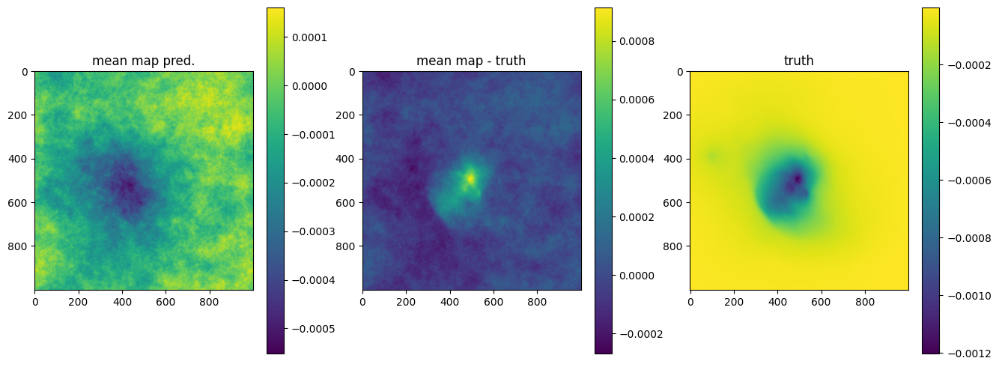

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+5.5023e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.3615e+07 Δ⛰:1.1408e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.2066e+07 Δ⛰:3.1549e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+7.3780e+06 Δ⛰:4.6877e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+5.7118e+06 Δ⛰:1.6662e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+3.6139e+06 Δ⛰:2.0979e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+2.6602e+06 Δ⛰:9.5367e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.1624e+06 Δ⛰:4.9781e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.6517e+06 Δ⛰:5.1070e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.3494e+06 Δ⛰:3.0230e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.3138e+06 Δ⛰:3.5653e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.0958e+06 Δ⛰:2.1801e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+8.8949e+05 Δ⛰:2.0628e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+6.8741e+05 Δ⛰:2.0209e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+5.7455e+05 Δ⛰:1.1285e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+4.6166e+05 Δ⛰:1.1290e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.1600e+05 Δ⛰:4.5651e+04 ➽:1.0400e+01
SL: 

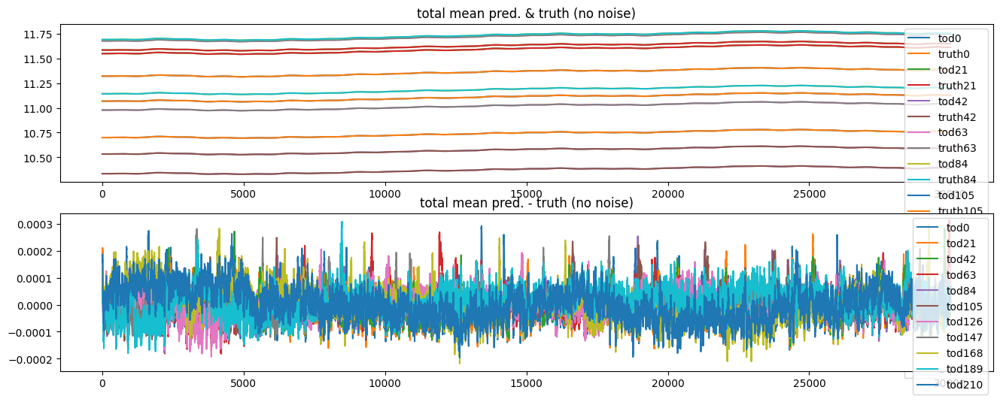

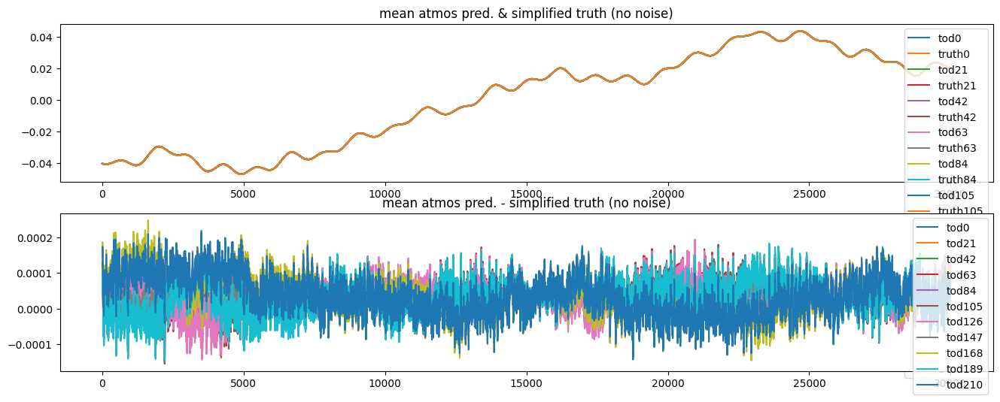

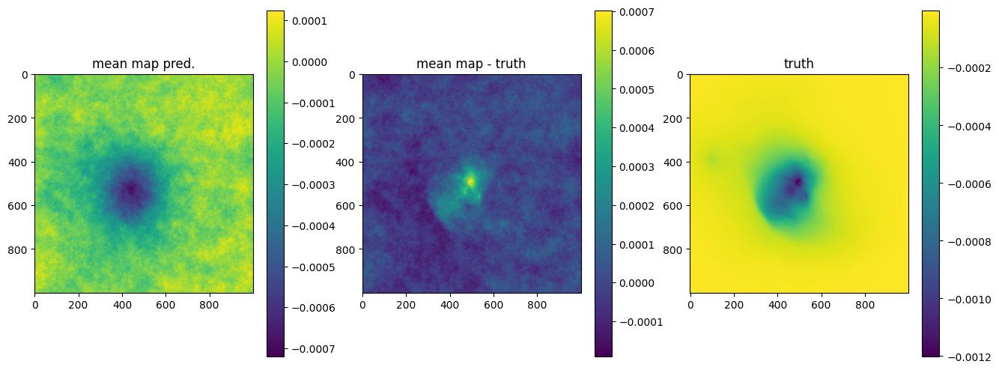

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+8.4416e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.0474e+07 Δ⛰:2.3942e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.6652e+07 Δ⛰:3.3822e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.1205e+07 Δ⛰:1.5447e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+8.4922e+06 Δ⛰:2.7132e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+3.5119e+06 Δ⛰:4.9803e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+2.5056e+06 Δ⛰:1.0064e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.6883e+06 Δ⛰:8.1726e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.1425e+06 Δ⛰:5.4581e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.1348e+06 Δ⛰:7.7153e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+8.2136e+05 Δ⛰:3.1341e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+5.3825e+05 Δ⛰:2.8311e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.6576e+05 Δ⛰:1.7249e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.2601e+05 Δ⛰:1.3975e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.1555e+05 Δ⛰:1.1045e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+5.6312e+04 Δ⛰:5.9239e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.9165e+04 Δ⛰:7.1475e+03 ➽:1.0400e+01
SL: 

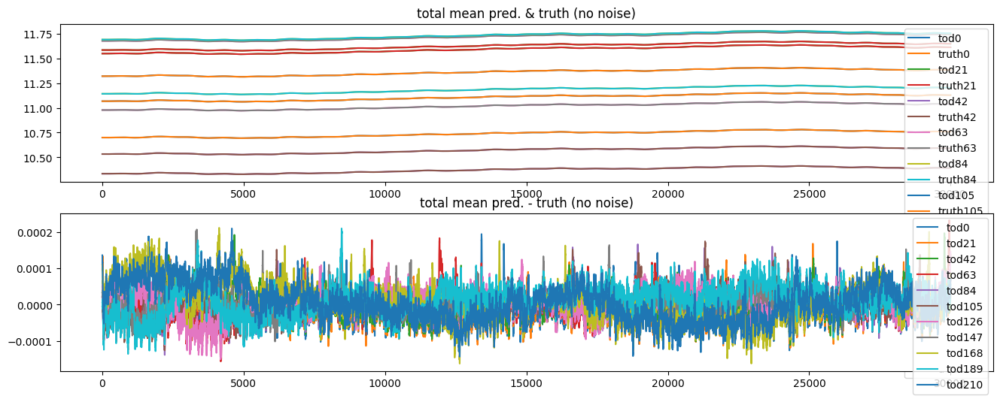

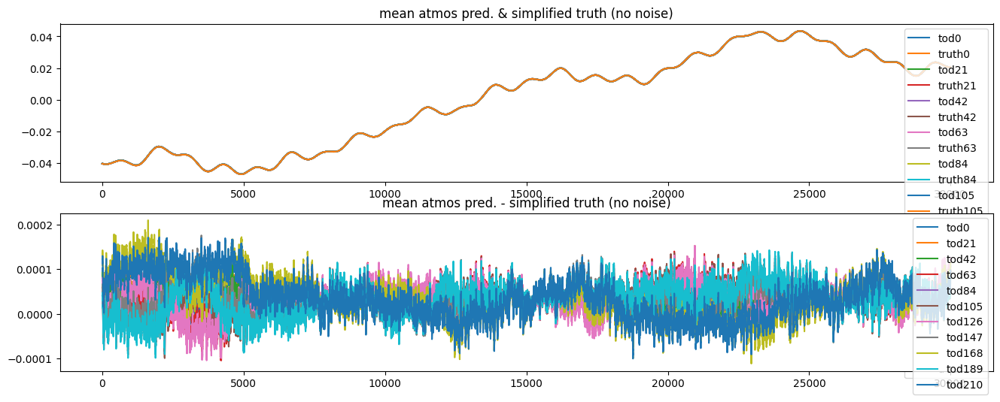

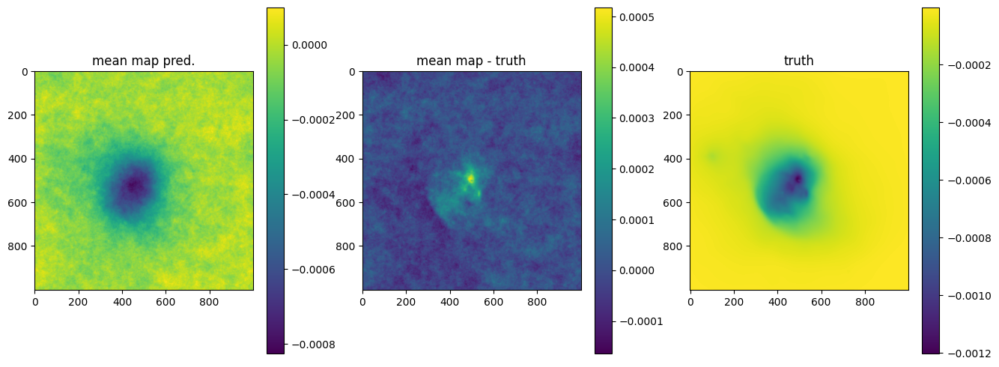

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+7.3515e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.7606e+07 Δ⛰:4.5909e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.3495e+07 Δ⛰:1.4110e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+8.2808e+06 Δ⛰:5.2146e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.6771e+06 Δ⛰:3.6037e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.9040e+06 Δ⛰:2.7731e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.2556e+06 Δ⛰:6.4839e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.0287e+06 Δ⛰:2.2694e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+6.3905e+05 Δ⛰:3.8965e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+6.0606e+05 Δ⛰:3.2992e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+5.1019e+05 Δ⛰:9.5868e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.6922e+05 Δ⛰:2.4097e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+9.0755e+04 Δ⛰:1.7846e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.0593e+04 Δ⛰:1.0135e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.0792e+05 Δ⛰:9.7327e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.2047e+05 Δ⛰:1.2547e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-1.6295e+05 Δ⛰:4.2482e+04 ➽:1.0400e+01
SL: 

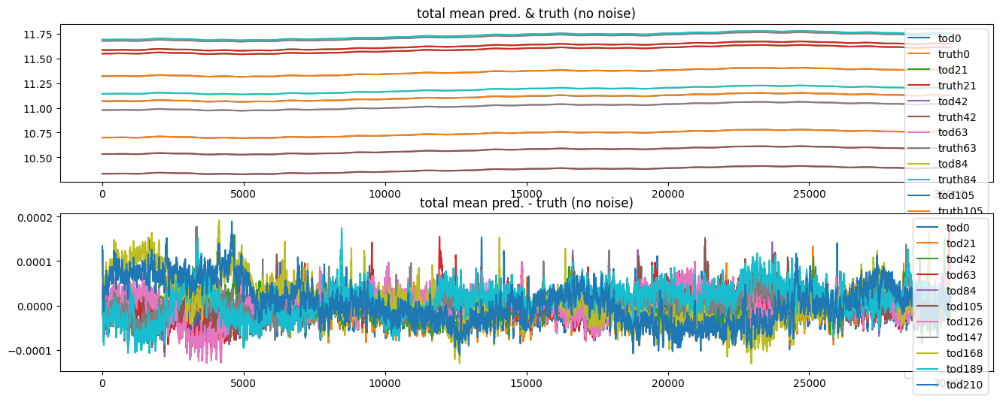

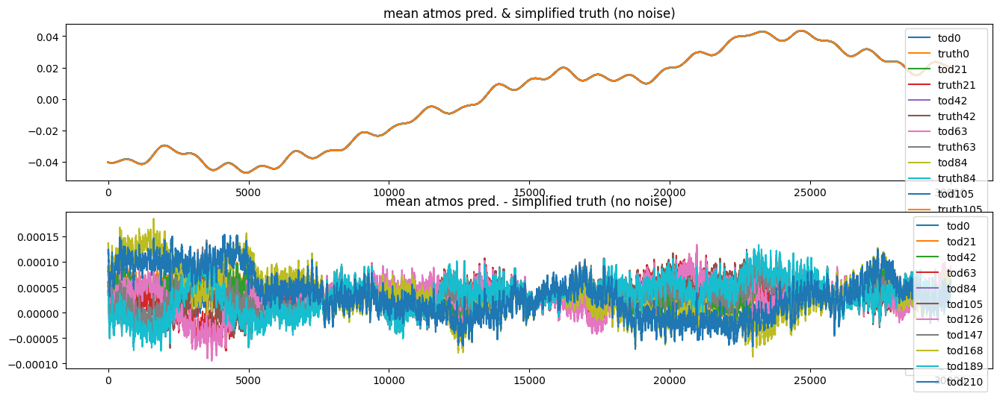

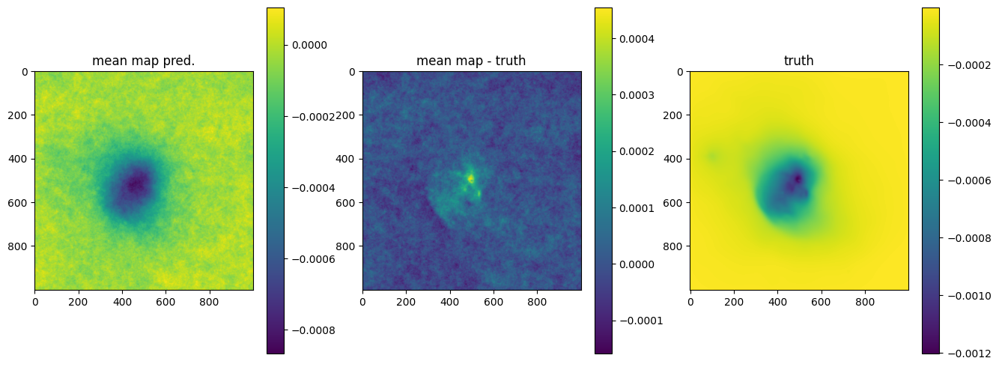

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+8.0434e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.0885e+07 Δ⛰:7.9346e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+4.1450e+06 Δ⛰:6.7395e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.1942e+06 Δ⛰:1.9509e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.8160e+06 Δ⛰:3.7820e+05 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.2089e+06 Δ⛰:6.0709e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.6632e+05 Δ⛰:6.4255e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.2409e+05 Δ⛰:1.4224e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.7752e+05 Δ⛰:2.4657e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.7619e+05 Δ⛰:1.3296e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+8.1484e+04 Δ⛰:9.4706e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-4.8065e+04 Δ⛰:1.2955e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-1.6896e+05 Δ⛰:1.2090e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.6689e+05 Δ⛰:9.7923e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-2.7355e+05 Δ⛰:6.6631e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.0240e+05 Δ⛰:2.8848e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.0274e+05 Δ⛰:3.4641e+02 ➽:1.0400e+01
SL: 

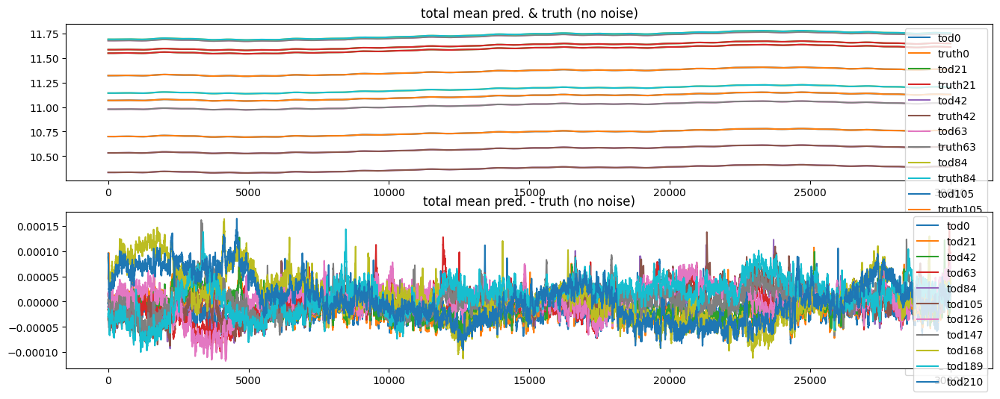

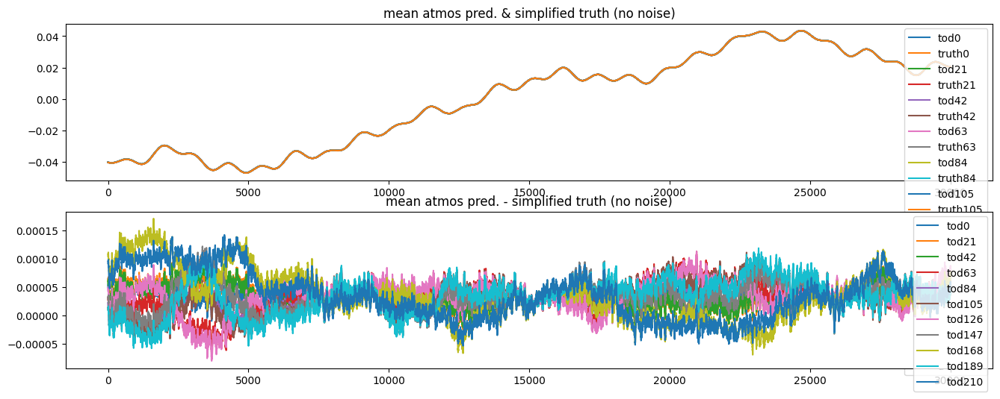

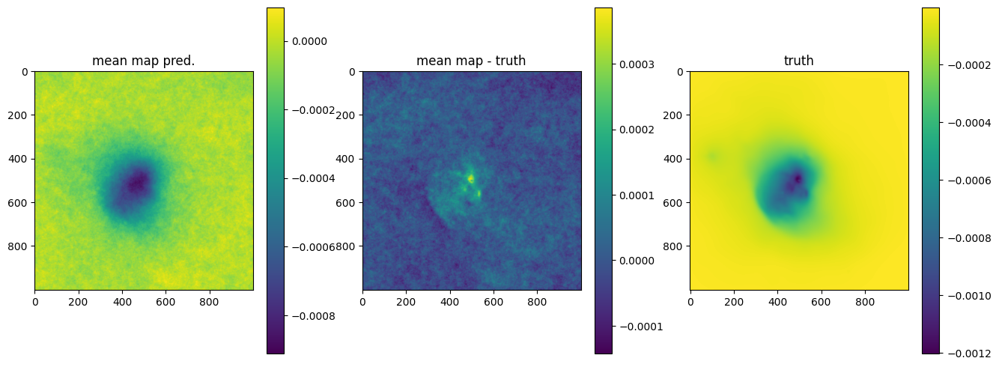

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+3.0154e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+9.5043e+06 Δ⛰:2.0649e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.4413e+06 Δ⛰:4.0630e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.9995e+06 Δ⛰:1.4418e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.3007e+06 Δ⛰:1.6987e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.2902e+06 Δ⛰:1.0106e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.7808e+05 Δ⛰:5.1208e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.2920e+05 Δ⛰:6.4888e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.1085e+04 Δ⛰:1.5028e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-3.2686e+04 Δ⛰:1.1601e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:-1.9247e+05 Δ⛰:1.5979e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-2.4351e+05 Δ⛰:5.1039e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.8683e+05 Δ⛰:4.3319e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.1176e+05 Δ⛰:2.4923e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.4721e+05 Δ⛰:3.5459e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.5413e+05 Δ⛰:6.9139e+03 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.6114e+05 Δ⛰:7.0103e+03 ➽:1.0400e+01
SL: 

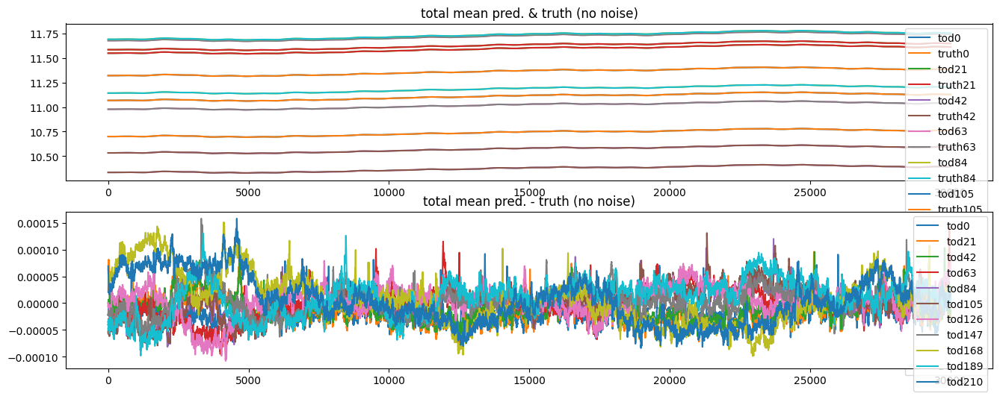

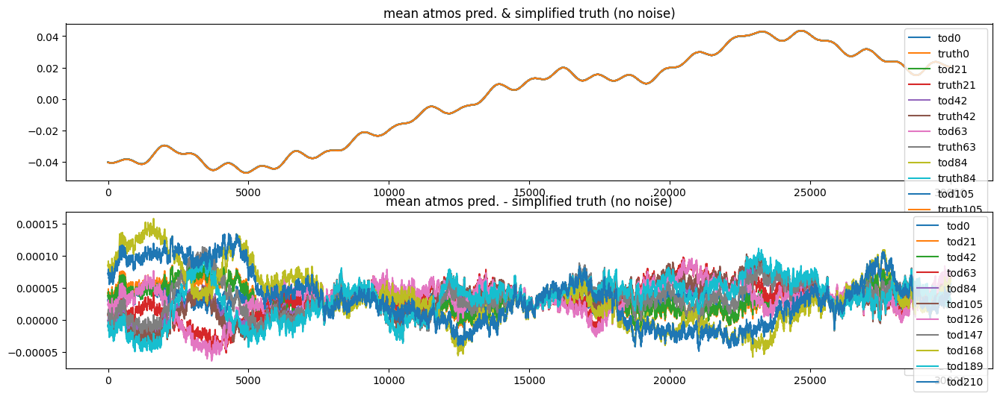

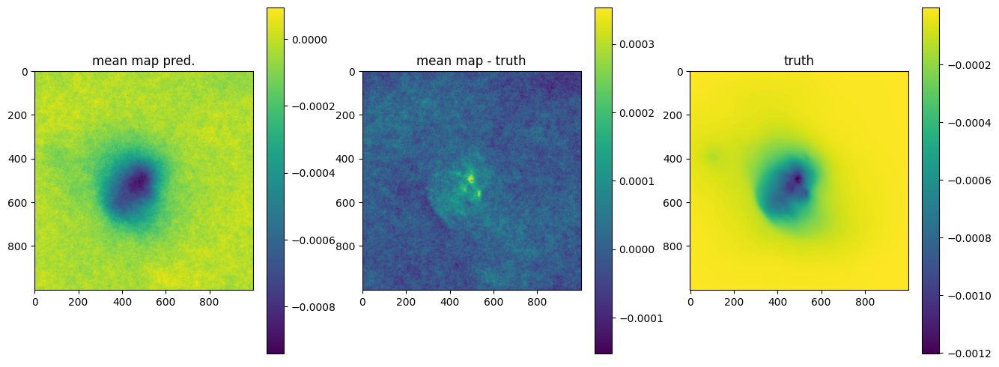

In [30]:
n_it = 20

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 2 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

# Extended Model:

In [31]:
samples.pos
initial_pos = {}
for k in samples.pos:
    if k == 'combcf xi':
        initial_pos[k] = jax.numpy.broadcast_to(samples.pos['combcf xi'], (n, samples.pos['combcf xi'].shape[1]))
    else:
        initial_pos[k] = samples.pos[k]

initial_pos = jft.Vector(initial_pos)

print(initial_pos)
initial_pos['combcf xi'].shape

Vector(
	{'cfmapax1fluctuations': Array(-22.7717328, dtype=float64),
	 'cfmapax1loglogavgslope': Array(3.80750058, dtype=float64),
	 'cfmapxi': Array([[  0.75809589,   8.99365622,  -9.90934596, ...,  -0.51682563,
	         -1.56036807,   3.88681889],
	       [  5.30516049,  -8.59177996,   7.70095354, ...,   2.52826482,
	          0.15305422,  -1.86315899],
	       [ -3.98311619,   3.25105927,  -6.65106393, ...,  -0.42551567,
	          1.8622153 ,   0.39916218],
	       ...,
	       [  1.84650516,  -2.07959254,  -0.06079332, ...,  -2.49762978,
	          3.58161433,  -5.14213822],
	       [ -7.84689579,   8.06831042,  -4.56278996, ...,   2.14926028,
	         -3.73697753,   4.37705311],
	       [  7.81381743, -10.30928595,   7.99894874, ...,  -0.98192454,
	          3.77722616,  -6.62024581]], dtype=float64),
	 'cfmapzeromode': Array(0.66161998, dtype=float64),
	 'combcf tod fluctuations': Array(-6.52659504, dtype=float64),
	 'combcf tod loglogavgslope': Array(-1.21040706, dtype=float6

(217, 40000)

In [32]:
# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
# gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1514fc655da0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x151b788667a0>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

In [33]:
# signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined with truth offsets & slopes
signal_response_tod = Signal_TOD(gp_tod, offset_tod, slopes, gp_map) # combined with truth offsets & slopes
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [34]:
x_tod = {k: initial_pos[k] for k in initial_pos if 'comb' in k}
gp_tod(x_tod).shape

(217, 40000)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+4.8289e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.1475e+07 Δ⛰:6.8140e+06 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.9067e+07 Δ⛰:2.4083e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.2989e+06 Δ⛰:3.3768e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.1821e+06 Δ⛰:3.1168e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:-2.6808e+05 Δ⛰:2.4502e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-1.5215e+06 Δ⛰:1.2534e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-1.8548e+06 Δ⛰:3.3332e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.1634e+06 Δ⛰:3.0863e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.7727e+06 Δ⛰:6.0933e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.7975e+06 Δ⛰:2.4723e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.2900e+06 Δ⛰:4.9249e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.4132e+06 Δ⛰:1.2328e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.4256e+06 Δ⛰:1.2393e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.5798e+06 Δ⛰:1.5420e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.7219e+06 Δ⛰:1.4212e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.7915e+06 Δ⛰:6.9529e+04 ➽:1.0400e+01
SL: 

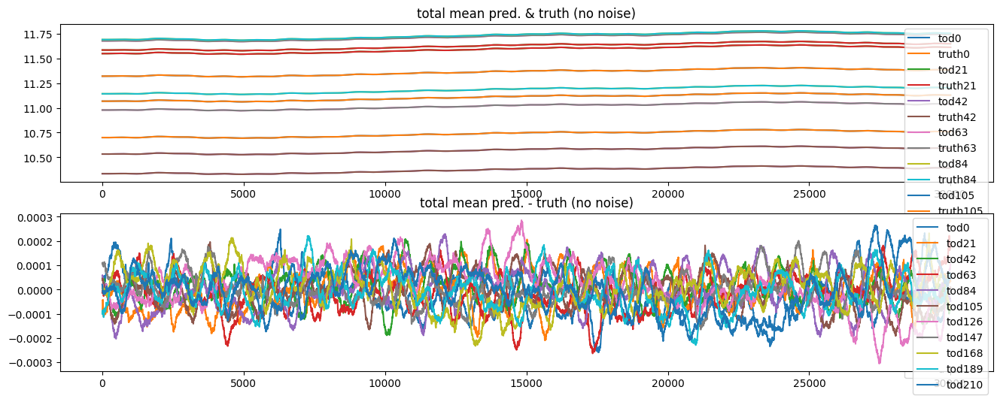

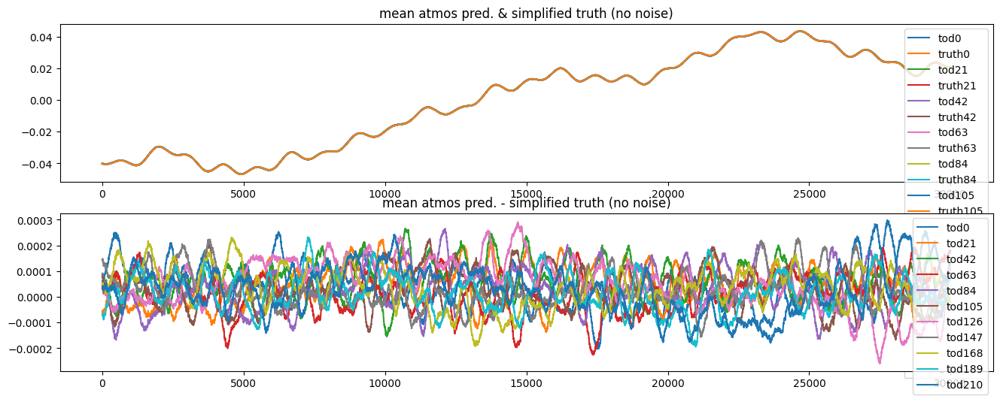

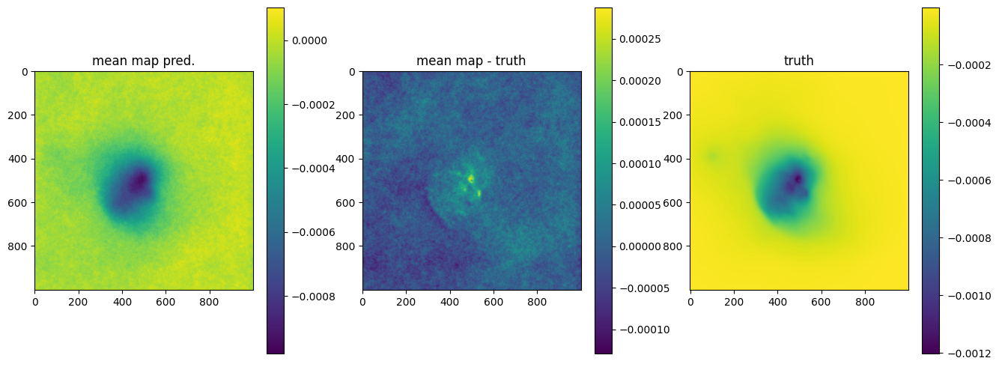

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+1.1008e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.8794e+07 Δ⛰:4.1286e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.8143e+07 Δ⛰:1.0651e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+8.3847e+06 Δ⛰:4.9758e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.9293e+06 Δ⛰:4.4554e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.4994e+05 Δ⛰:3.4793e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-8.2376e+05 Δ⛰:1.2737e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-1.3548e+06 Δ⛰:5.3104e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-1.7037e+06 Δ⛰:3.4886e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.3218e+06 Δ⛰:6.1818e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.3976e+06 Δ⛰:7.5812e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-2.9671e+06 Δ⛰:5.6948e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.9971e+06 Δ⛰:2.9930e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.1417e+06 Δ⛰:1.4467e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.3255e+06 Δ⛰:1.8377e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.4987e+06 Δ⛰:1.7318e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.5826e+06 Δ⛰:8.3927e+04 ➽:1.0400e+01
SL: 

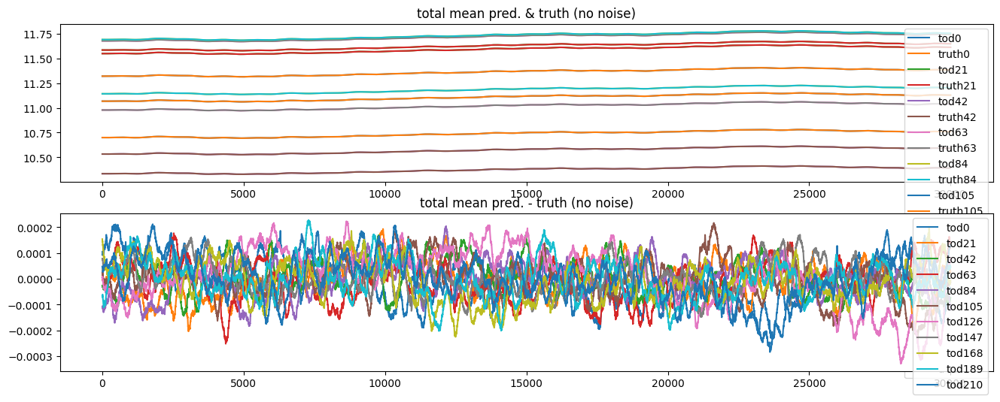

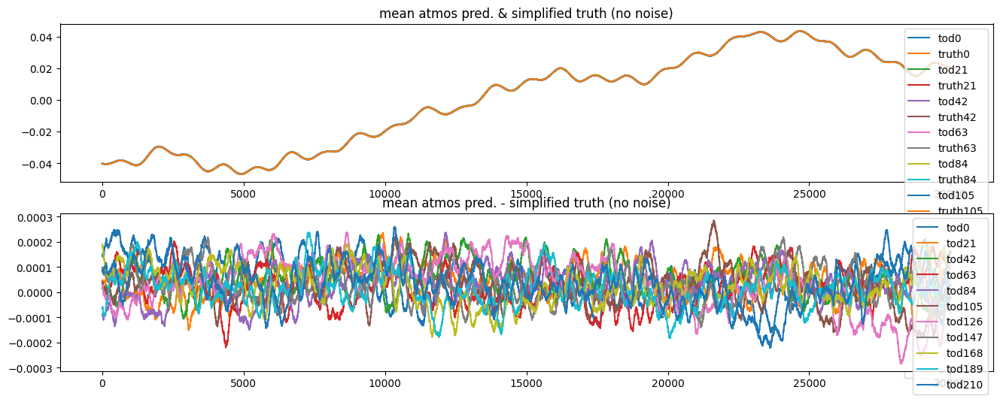

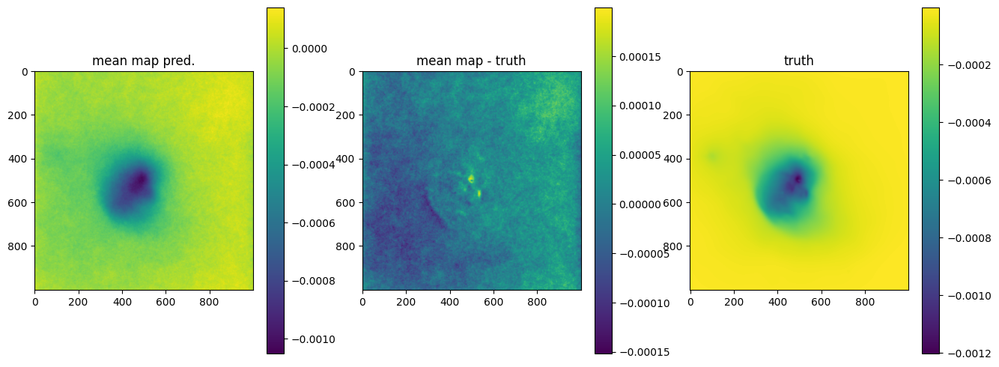

In [35]:
n_it = 2

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 1 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    # lh, # likelihood
    # jft.Vector(lh.init(k_i)), # initial position in model space (initialisation) # TODO: replace!!
    lh_tod,
    initial_pos,
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    # sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [36]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.00112057672492532, 0.0015, 0.0001
	loglogvarslope: -2.499953128404111, -2.45, 0.1
	zeromode std (LogNormal): 2.5078326881802943e-06, 1e-05, 9.9e-06
map:
	fluctuations: 3.187255193598764e-05, 5.6e-05, 1e-06
	loglogvarslope: -1.9994387751970493, -2.5, 0.1
	zeromode std (LogNormal): 3.174884487515233e-10, 1e-08, 1e-07


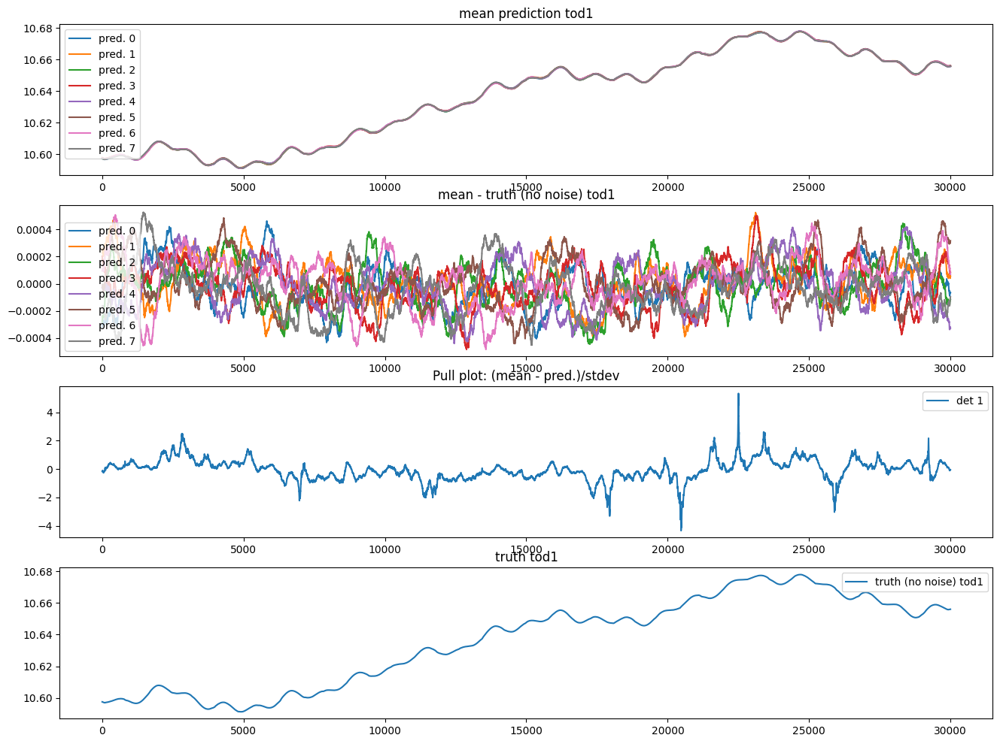

In [37]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

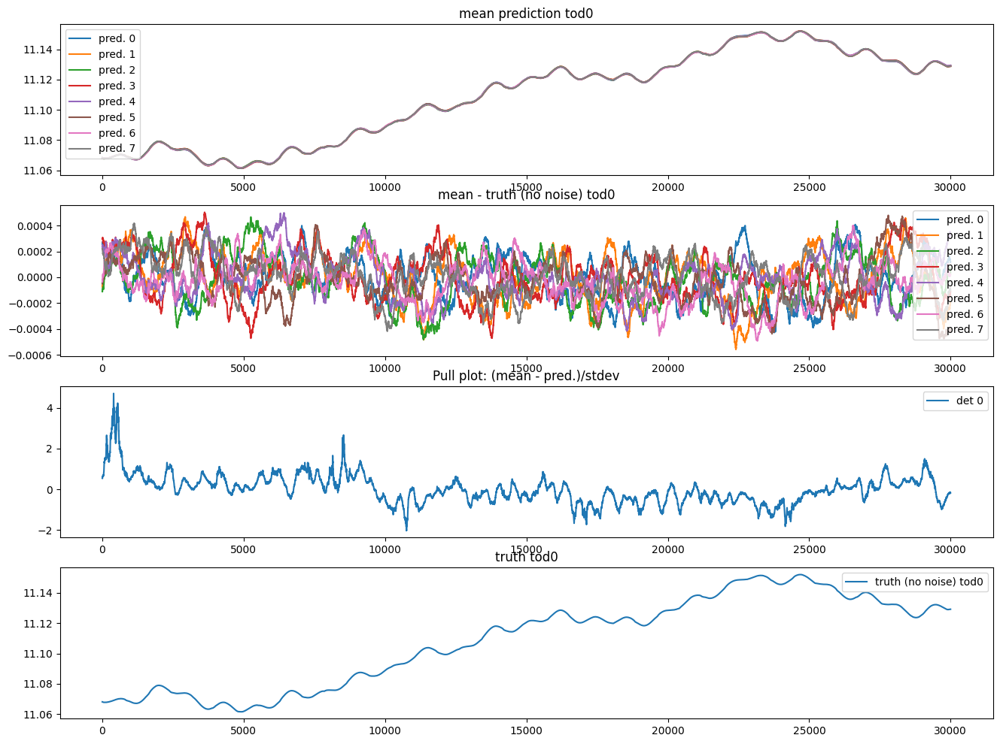

In [38]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [39]:
from maria.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"name": "hamming"},
                        "remove_modes": {"modes_to_remove": [0]},
                        "despline": {"knot_spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:08<00:00,  8.86s/it]


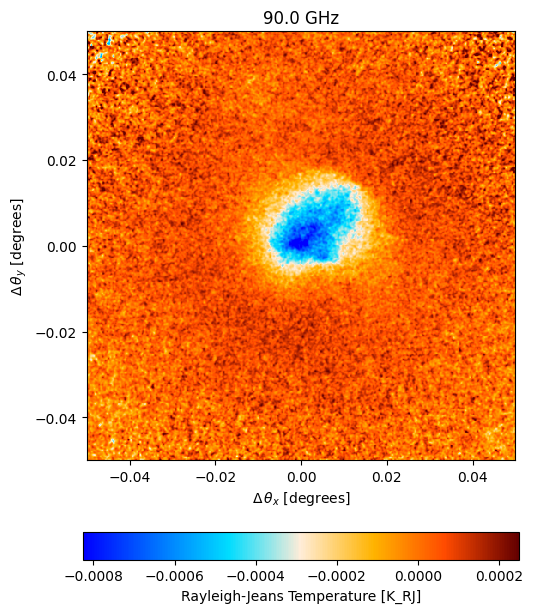

In [40]:
output_map.plot()

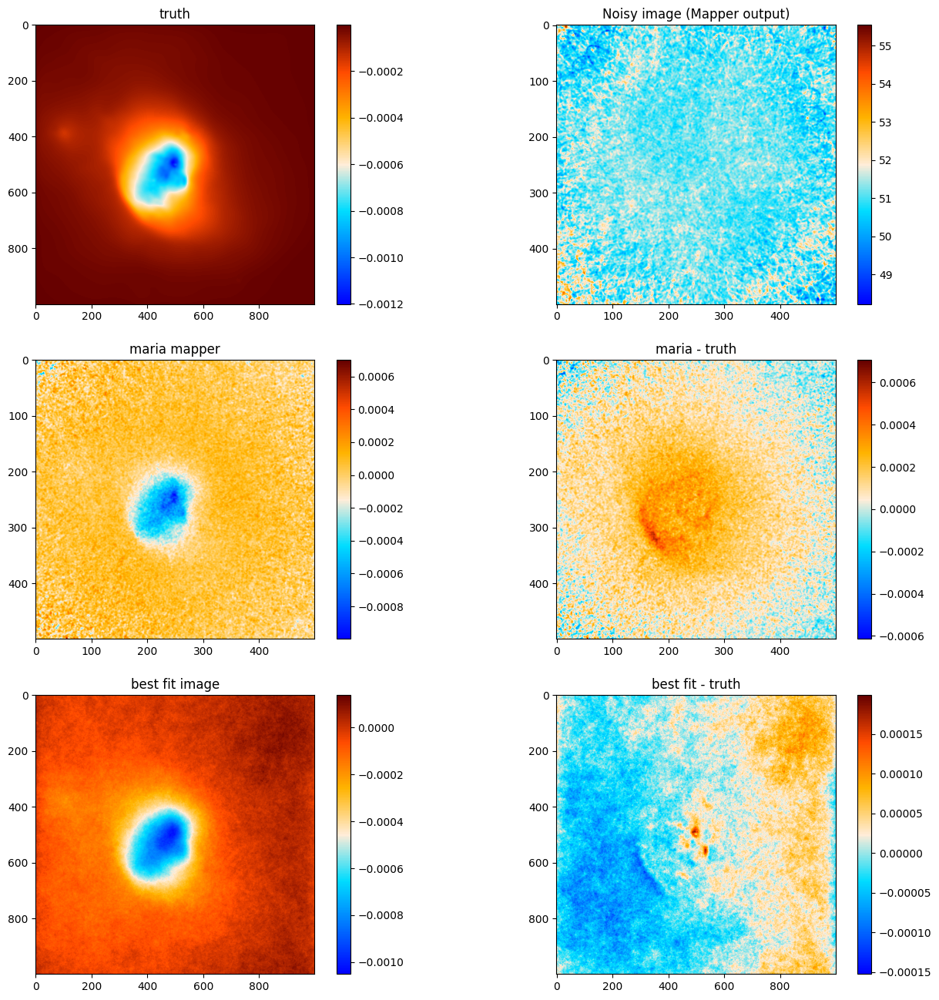

In [41]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0,0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0,0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0,0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()

## Compare with smoothed truth

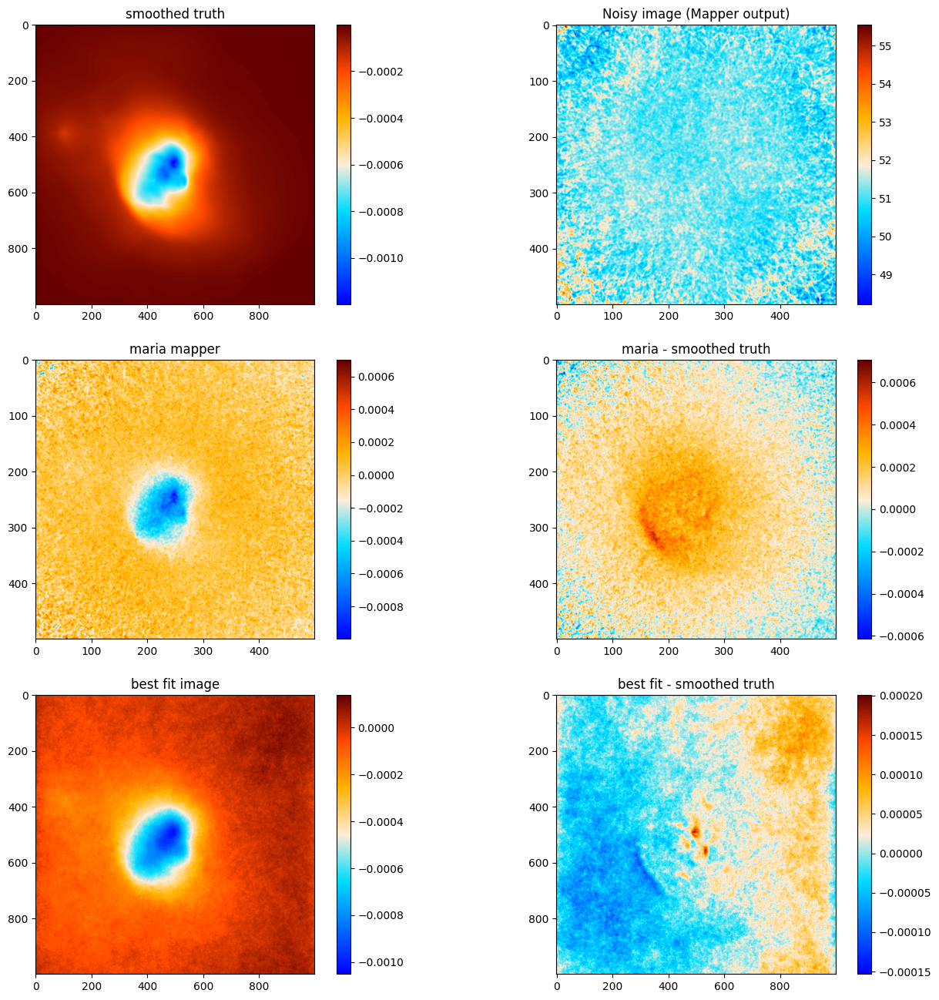

In [42]:
from skimage.transform import resize
from scipy.ndimage import uniform_filter

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

smoothed_truth = uniform_filter(mapdata_truth[0,0], size=4)
# smoothed_truth = output_map_truth.data[0,0]

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( smoothed_truth , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('smoothed truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(smoothed_truth, (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - smoothed truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - smoothed_truth), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - smoothed truth')
fig.colorbar(im4)

plt.show()